# import libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import os 

# Read and Explore Data

In [2]:
os.listdir(r"D:\ali\ML.mostafa_osman\Maven\MavenToys\Maven Toys Data")

['calendar.csv',
 'data_dictionary.csv',
 'inventory.csv',
 'products.csv',
 'sales.csv',
 'stores.csv']

In [3]:
for i in os.listdir(r"D:\ali\ML.mostafa_osman\Maven\MavenToys\Maven Toys Data"):
    path=os.path.join(r"D:\ali\ML.mostafa_osman\Maven\MavenToys\Maven Toys Data",i)
    globals()[i[:-4]]=pd.read_csv(path)

#### data calendar

In [4]:
calendar

,Date
0,1/1/2022
1,1/2/2022
2,1/3/2022
3,1/4/2022
4,1/5/2022
...,...
633,9/26/2023
634,9/27/2023
635,9/28/2023
636,9/29/2023


In [5]:
calendar.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 638 entries, 0 to 637
Data columns (total 1 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Date    638 non-null    object
dtypes: object(1)
memory usage: 5.1+ KB


In [6]:
calendar.duplicated().sum()

np.int64(0)

In [7]:
calendar['Date']=pd.to_datetime(calendar['Date'])

In [8]:
calendar['Date'].dtypes

dtype('<M8[ns]')

In [9]:
calendar['Date'].head(5),calendar['Date'].tail(5)

(0   2022-01-01
 1   2022-01-02
 2   2022-01-03
 3   2022-01-04
 4   2022-01-05
 Name: Date, dtype: datetime64[ns],
 633   2023-09-26
 634   2023-09-27
 635   2023-09-28
 636   2023-09-29
 637   2023-09-30
 Name: Date, dtype: datetime64[ns])

#### data inventory

In [10]:
inventory.head(5),inventory.tail(5)

(   Store_ID  Product_ID  Stock_On_Hand
 0         1           1             27
 1         1           2              0
 2         1           3             32
 3         1           4              6
 4         1           5              0,
       Store_ID  Product_ID  Stock_On_Hand
 1588        50          31             18
 1589        50          32              9
 1590        50          33              1
 1591        50          34             17
 1592        50          35              8)

In [11]:
inventory.duplicated().sum()

np.int64(0)

#### data products

In [12]:
products

,Product_ID,Product_Name,Product_Category,Product_Cost,Product_Price
0,1,Action Figure,Toys,$9.99,$15.99
1,2,Animal Figures,Toys,$9.99,$12.99
2,3,Barrel O' Slime,Art & Crafts,$1.99,$3.99
3,4,Chutes & Ladders,Games,$9.99,$12.99
4,5,Classic Dominoes,Games,$7.99,$9.99
5,6,Colorbuds,Electronics,$6.99,$14.99
6,7,Dart Gun,Sports & Outdoors,$11.99,$15.99
7,8,Deck Of Cards,Games,$3.99,$6.99
8,9,Dino Egg,Toys,$9.99,$10.99
9,10,Dinosaur Figures,Toys,$10.99,$14.99


In [13]:
products.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35 entries, 0 to 34
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Product_ID        35 non-null     int64 
 1   Product_Name      35 non-null     object
 2   Product_Category  35 non-null     object
 3   Product_Cost      35 non-null     object
 4   Product_Price     35 non-null     object
dtypes: int64(1), object(4)
memory usage: 1.5+ KB


In [14]:
products.duplicated().sum()

np.int64(0)

In [15]:
products['Product_Cost'] = products['Product_Cost'].str.replace(r'[$]', '', regex=True)
products['Product_Cost']=products['Product_Cost'].astype(float)

In [16]:
products['Product_Price']=products['Product_Price'].str.replace(r'[$]','',regex=True)
products['Product_Price']=products['Product_Price'].astype(float)

In [17]:
products['Revenue']=products['Product_Price']-products['Product_Cost']

In [18]:
products

,Product_ID,Product_Name,Product_Category,Product_Cost,Product_Price,Revenue
0,1,Action Figure,Toys,9.99,15.99,6.0
1,2,Animal Figures,Toys,9.99,12.99,3.0
2,3,Barrel O' Slime,Art & Crafts,1.99,3.99,2.0
3,4,Chutes & Ladders,Games,9.99,12.99,3.0
4,5,Classic Dominoes,Games,7.99,9.99,2.0
5,6,Colorbuds,Electronics,6.99,14.99,8.0
6,7,Dart Gun,Sports & Outdoors,11.99,15.99,4.0
7,8,Deck Of Cards,Games,3.99,6.99,3.0
8,9,Dino Egg,Toys,9.99,10.99,1.0
9,10,Dinosaur Figures,Toys,10.99,14.99,4.0


#### data sales

In [99]:
sales

,Sale_ID,Store_ID,Product_ID,Units,year,month,day
Date,,,,,,,
2022-01-01,1,24,4,1,2022,January,1
2022-01-01,2,28,1,1,2022,January,1
2022-01-01,3,6,8,1,2022,January,1
2022-01-01,4,48,7,1,2022,January,1
2022-01-01,5,44,18,1,2022,January,1
...,...,...,...,...,...,...,...
2023-09-30,829258,24,19,1,2023,September,30
2023-09-30,829259,16,35,1,2023,September,30
2023-09-30,829260,22,19,1,2023,September,30


In [20]:
sales['Date']=pd.to_datetime(sales['Date'])

In [21]:
sales=sales.set_index('Date')

In [22]:
sales

,Sale_ID,Store_ID,Product_ID,Units
Date,,,,
2022-01-01,1,24,4,1
2022-01-01,2,28,1,1
2022-01-01,3,6,8,1
2022-01-01,4,48,7,1
2022-01-01,5,44,18,1
...,...,...,...,...
2023-09-30,829258,24,19,1
2023-09-30,829259,16,35,1
2023-09-30,829260,22,19,1


In [23]:
sales['year']=sales.index.year
sales['month']=sales.index.month_name()
sales['day']=sales.index.day

In [24]:
sales.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 829262 entries, 2022-01-01 to 2023-09-30
Data columns (total 7 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   Sale_ID     829262 non-null  int64 
 1   Store_ID    829262 non-null  int64 
 2   Product_ID  829262 non-null  int64 
 3   Units       829262 non-null  int64 
 4   year        829262 non-null  int32 
 5   month       829262 non-null  object
 6   day         829262 non-null  int32 
dtypes: int32(2), int64(4), object(1)
memory usage: 44.3+ MB


In [25]:
sales.duplicated().sum()

np.int64(0)

In [26]:
sales

,Sale_ID,Store_ID,Product_ID,Units,year,month,day
Date,,,,,,,
2022-01-01,1,24,4,1,2022,January,1
2022-01-01,2,28,1,1,2022,January,1
2022-01-01,3,6,8,1,2022,January,1
2022-01-01,4,48,7,1,2022,January,1
2022-01-01,5,44,18,1,2022,January,1
...,...,...,...,...,...,...,...
2023-09-30,829258,24,19,1,2023,September,30
2023-09-30,829259,16,35,1,2023,September,30
2023-09-30,829260,22,19,1,2023,September,30


#### data store

In [27]:
stores

,Store_ID,Store_Name,Store_City,Store_Location,Store_Open_Date
0,1,Maven Toys Guadalajara 1,Guadalajara,Residential,1992-09-18
1,2,Maven Toys Monterrey 1,Monterrey,Residential,1995-04-27
2,3,Maven Toys Guadalajara 2,Guadalajara,Commercial,1999-12-27
3,4,Maven Toys Saltillo 1,Saltillo,Downtown,2000-01-01
4,5,Maven Toys La Paz 1,La Paz,Downtown,2001-05-31
5,6,Maven Toys Mexicali 1,Mexicali,Commercial,2003-12-13
6,7,Maven Toys Monterrey 2,Monterrey,Downtown,2003-12-25
7,8,Maven Toys Pachuca 1,Pachuca,Downtown,2004-10-14
8,9,Maven Toys Ciudad de Mexico 1,Cuidad de Mexico,Downtown,2004-10-15
9,10,Maven Toys Campeche 1,Campeche,Downtown,2005-01-14


In [28]:
stores.duplicated().sum()

np.int64(0)

In [29]:
stores['Store_Open_Date']=pd.to_datetime(stores['Store_Open_Date'])

In [30]:
merged=pd.merge(sales,stores,on='Store_ID')
merged['Sale_ID']=merged['Sale_ID']-1
merged=merged.set_index('Sale_ID')
data_before=pd.merge(merged,products,on='Product_ID')

In [31]:
data_before=data_before[['Store_ID','Store_Name','Store_City','Store_Location','Units','Store_Open_Date','Product_ID','Product_Name','Product_Category','Product_Cost','Product_Price','year','month','day','Revenue']]
data=data_before.drop(['Store_ID','Product_ID'],axis=1)

# Analysis and Visualization

## Stores

#### STORE_NAME

In [32]:
data['Store_Name'].value_counts()

Store_Name
Maven Toys Ciudad de Mexico 2    29024
Maven Toys Ciudad de Mexico 1    24482
Maven Toys Toluca 1              23533
Maven Toys Guadalajara 3         23384
Maven Toys Monterrey 2           21300
Maven Toys Ciudad de Mexico 3    19551
Maven Toys Saltillo 1            18924
Maven Toys Xalapa 2              18809
Maven Toys Guadalajara 4         18739
Maven Toys Guanajuato 1          18157
Maven Toys Hermosillo 2          18018
Maven Toys Campeche 1            17695
Maven Toys Ciudad de Mexico 4    17668
Maven Toys Mexicali 2            16991
Maven Toys Mexicali 1            16864
Maven Toys Puebla 2              16764
Maven Toys Chihuahua 2           16580
Maven Toys Hermosillo 3          16553
Maven Toys Guanajuato 2          16494
Maven Toys Guadalajara 2         16331
Maven Toys Villahermosa 1        16324
Maven Toys Monterrey 4           16276
Maven Toys Santiago 1            16111
Maven Toys Monterrey 3           16049
Maven Toys Ciudad Victoria 1     16034
Maven Toys Gua

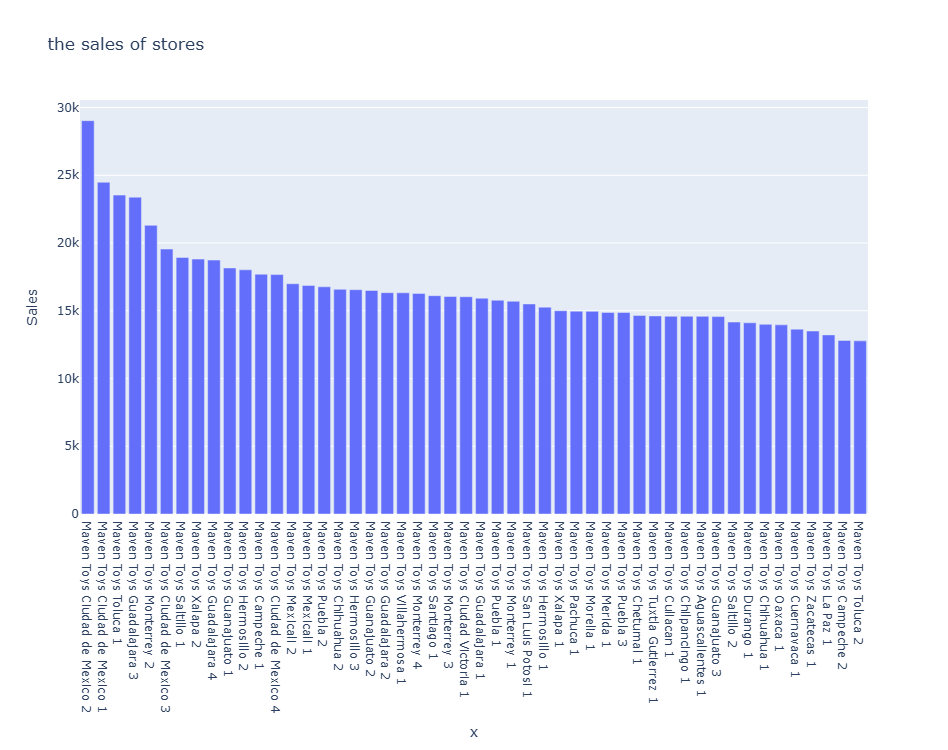

In [59]:
fig=px.bar(x=data['Store_Name'].value_counts().index,y=data['Store_Name'].value_counts().values,title='the sales of stores',height=750,width=1000)
fig.update_yaxes(title='Sales')

<Axes: title={'center': 'each store open in '}, xlabel='Store_Name', ylabel='Store_Open_Date'>

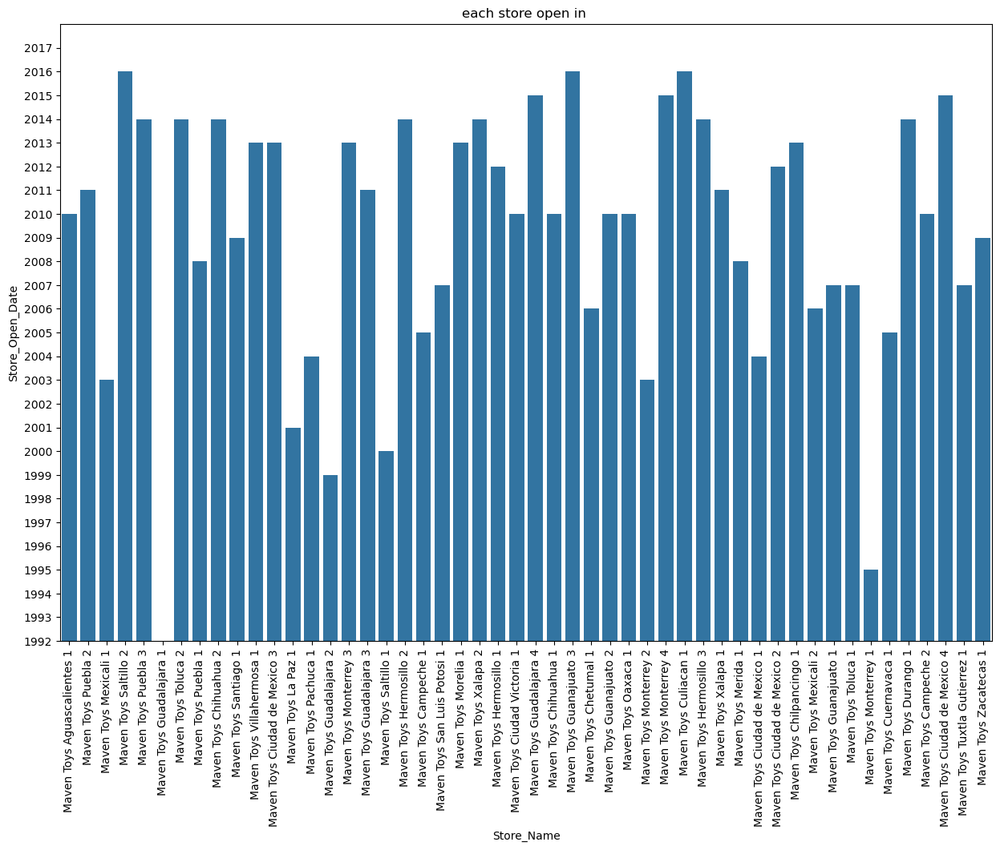

In [34]:
plt.figure(figsize=(15,10))
plt.xticks(rotation=90)
plt.yticks(range(data['Store_Open_Date'].dt.year.min()
,data['Store_Open_Date'].dt.year.max()+2,1))
plt.title('each store open in ')
plt.ylim(data['Store_Open_Date'].dt.year.min()
,data['Store_Open_Date'].dt.year.max()+2
)
sns.barplot(x=data['Store_Name'],y=data['Store_Open_Date'].dt.year)

In [35]:
for i in data['Store_Name'].value_counts().index:
    store=data[data['Store_Name']==i]
    fig=px.line(x=store['Product_Name'].value_counts().index,y=store['Product_Name'].value_counts().values,title=f'the best seller product in {i} store')
    fig.update_yaxes(title='Sales')
    fig.show()

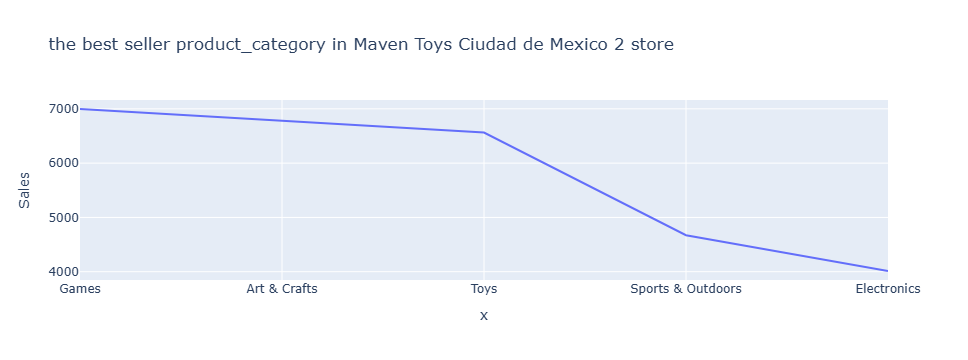

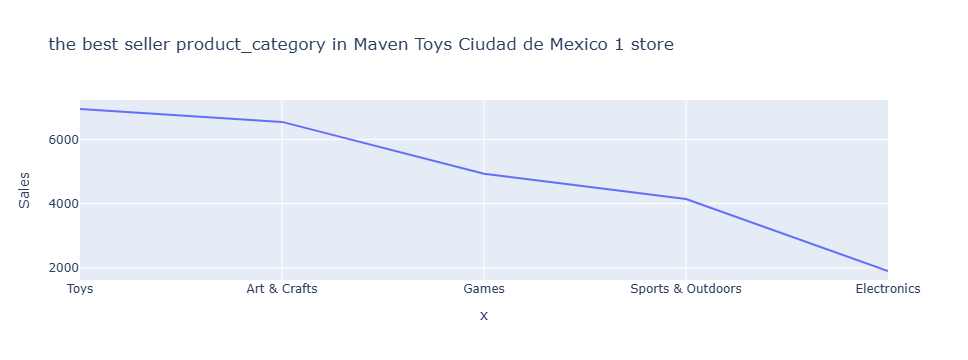

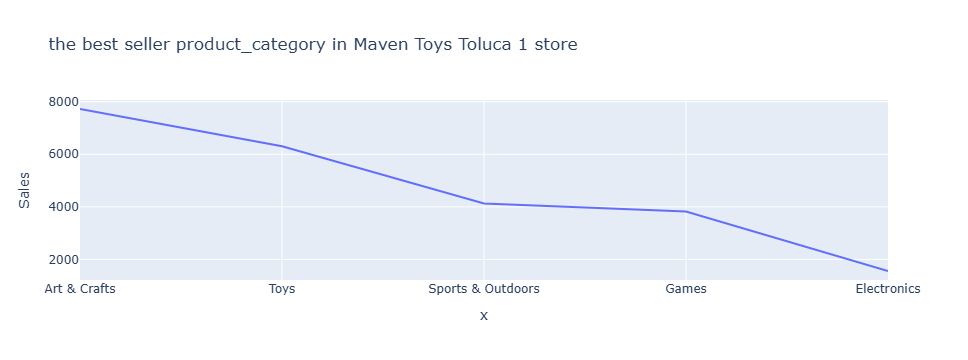

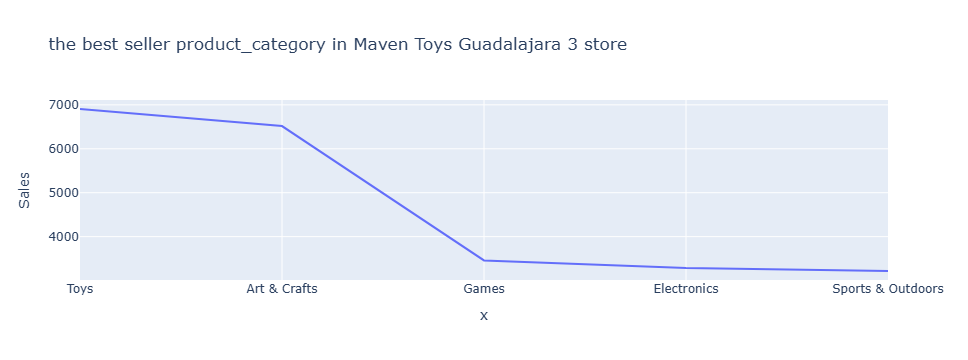

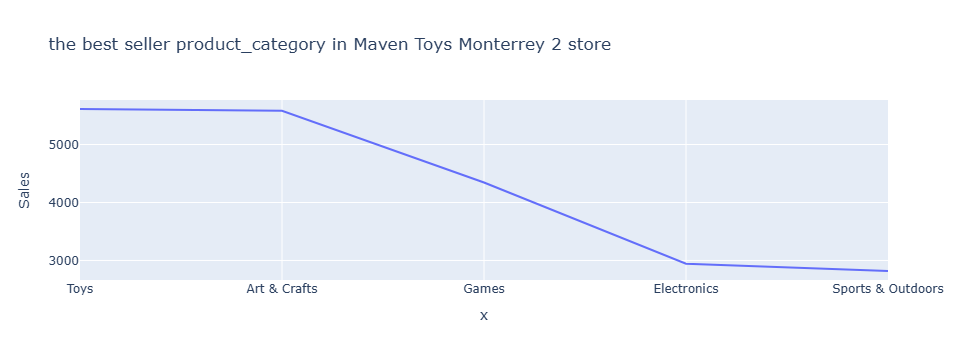

...

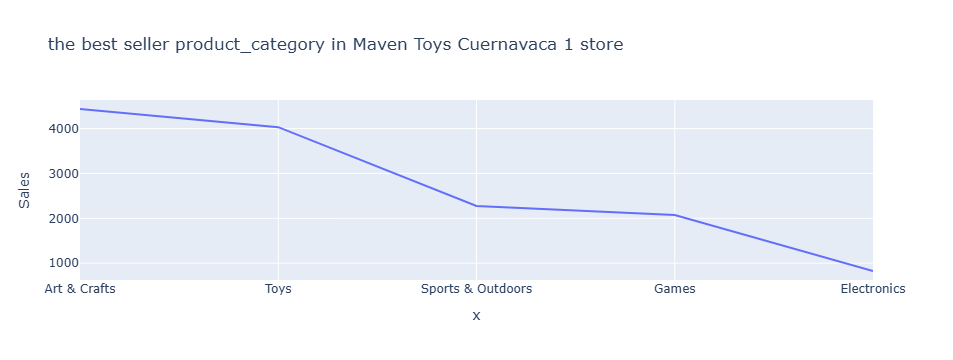

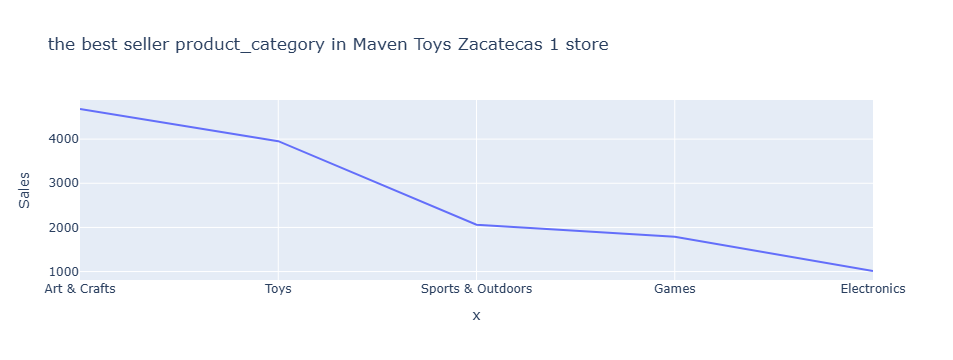

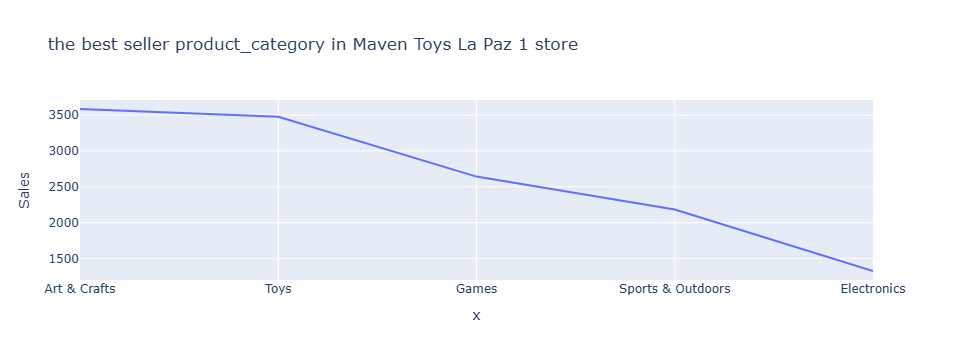

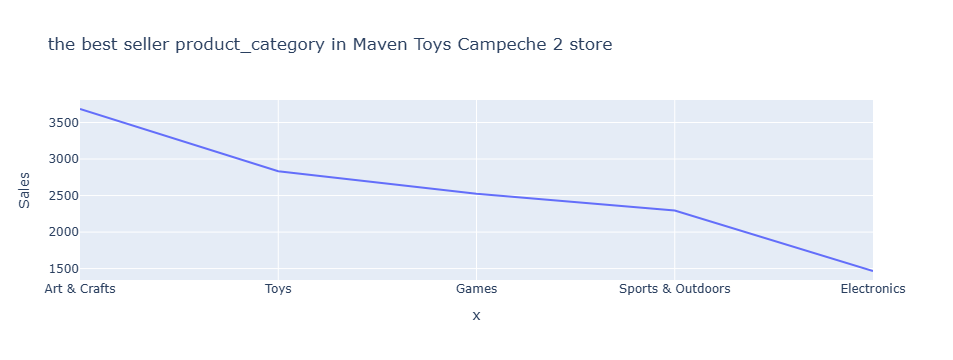

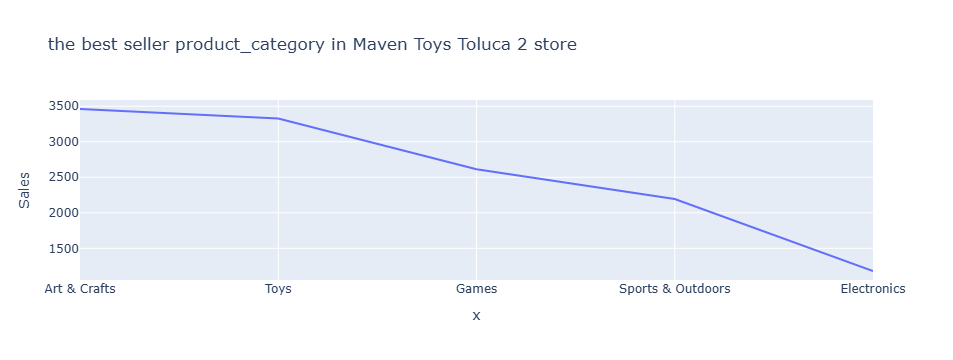

In [36]:
for i in data['Store_Name'].value_counts().index:
    store=data[data['Store_Name']==i]
    fig=px.line(x=store['Product_Category'].value_counts().index,y=store['Product_Category'].value_counts().values,title=f'the best seller product_category in {i} store')
    fig.update_yaxes(title='Sales')
    fig.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_11056\947184162.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



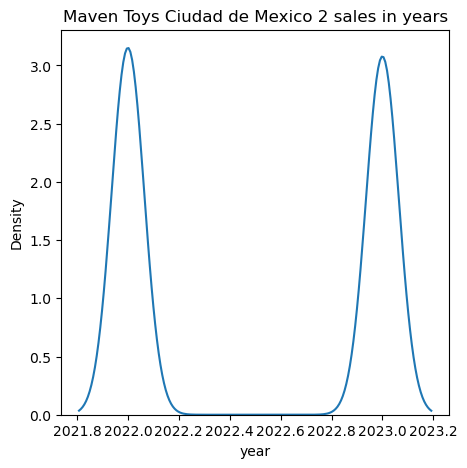

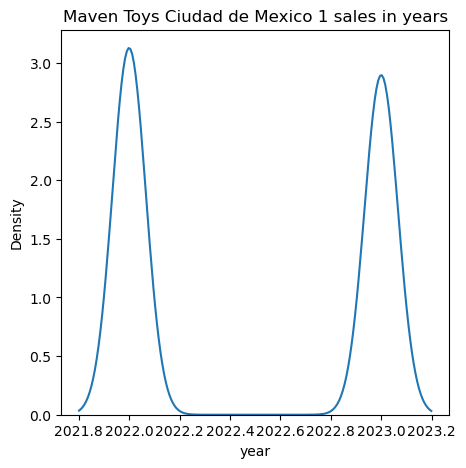

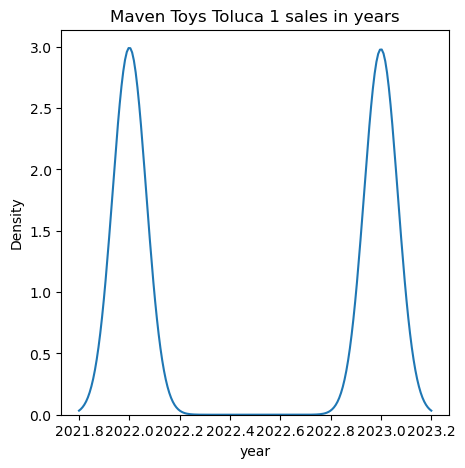

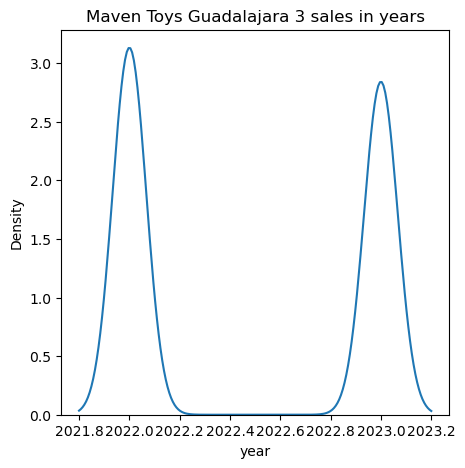

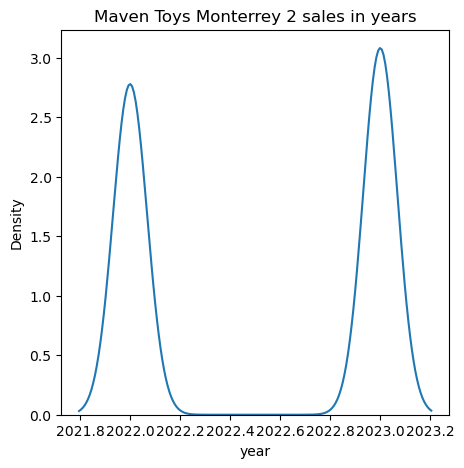

...

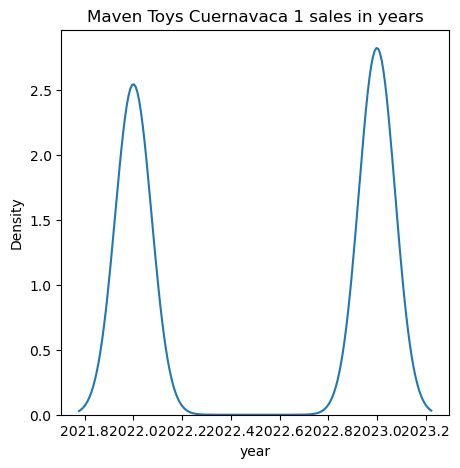

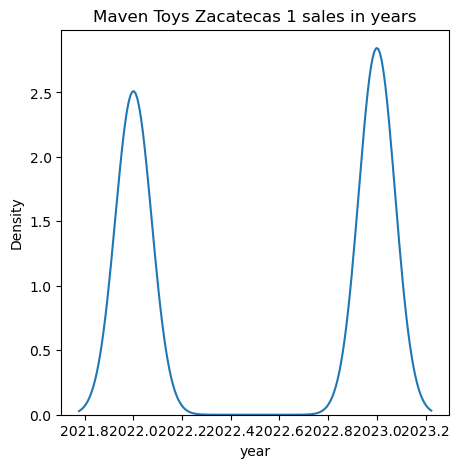

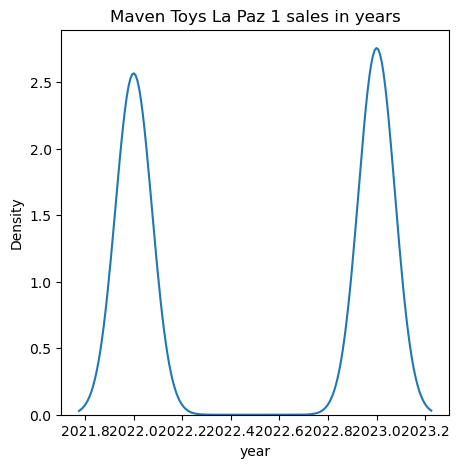

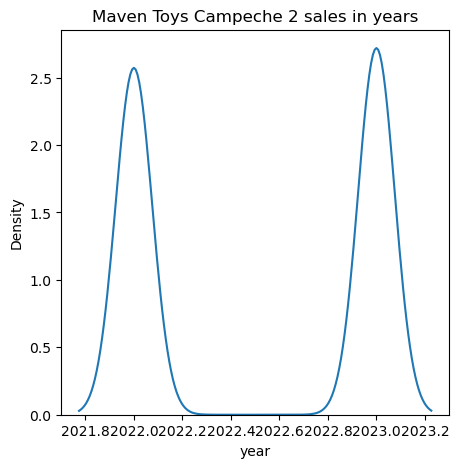

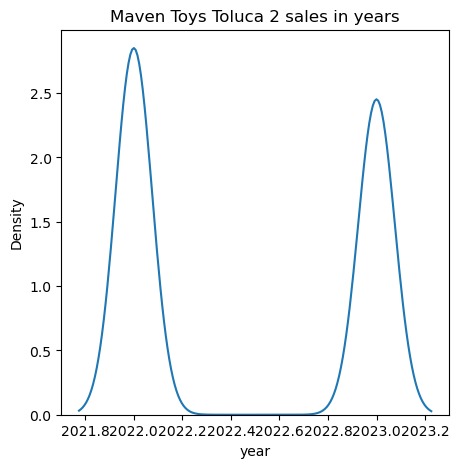

In [37]:
for i in data['Store_Name'].value_counts().index:
    store=data[data['Store_Name']==i]
    plt.figure(figsize=(5,5))
    plt.title(f'{i} sales in years')           
    sns.kdeplot(x=store['year'])

In [38]:
group=data.groupby(['Store_Name'])['Revenue'].sum()
fig=px.line(x=group.index,y=group.values,title='Store_Name VS Revenue',height=1000,width=1000)
fig.update_yaxes(title='Revenue')

#### STORE_CITY

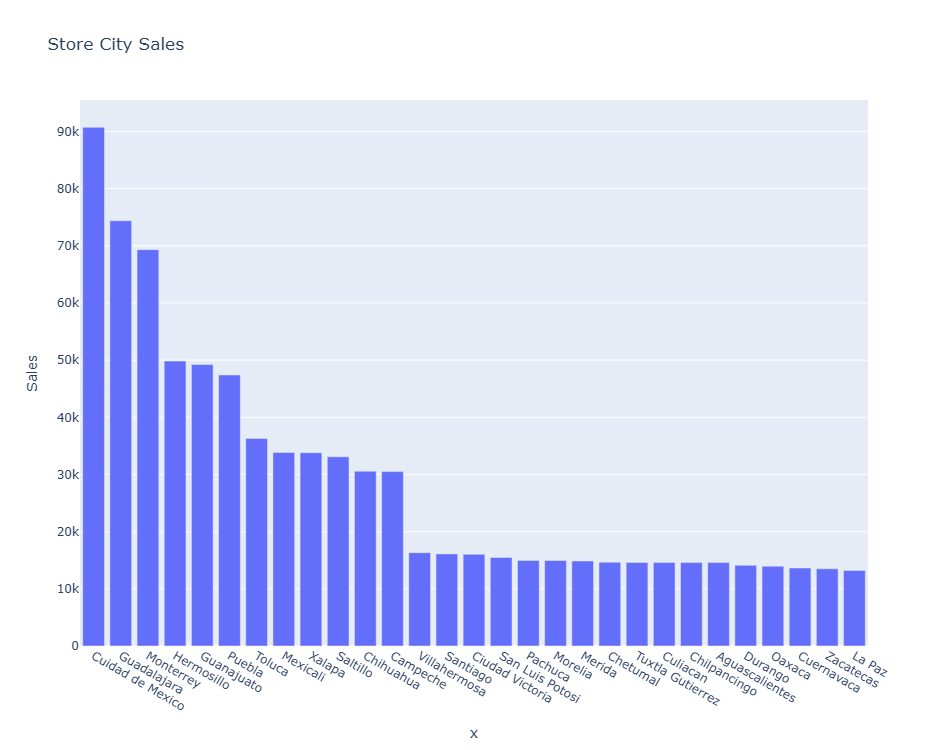

In [60]:
fig=px.bar(x=data['Store_City'].value_counts().index,y=data['Store_City'].value_counts().values,title='Store City Sales',height=750,width=1000)
fig.update_yaxes(title='Sales')

In [41]:
group1=data.groupby(['Store_City'])['Store_Name'].nunique()
fig=px.bar(x=group1.index,y=group1.values,title='the number of stores in city',height=750,width=1000)
fig.update_yaxes(title='Number of Stores')

In [43]:
for i in data['Store_City'].value_counts().index:
    store=data[data['Store_City']==i]
    fig=px.line(x=store['Product_Name'].value_counts().index,y=store['Product_Name'].value_counts().values,title=f'the best seller product in {i} City')
    fig.update_yaxes(title='Sales')
    fig.show()

In [44]:
for i in data['Store_City'].value_counts().index:
    store=data[data['Store_City']==i]
    fig=px.line(x=store['Product_Category'].value_counts().index,y=store['Product_Category'].value_counts().values,title=f'the best seller product_category in {i} City')
    fig.update_yaxes(title='Sales')
    fig.show()

C:\Users\DELL\AppData\Local\Temp\ipykernel_11056\1203367870.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



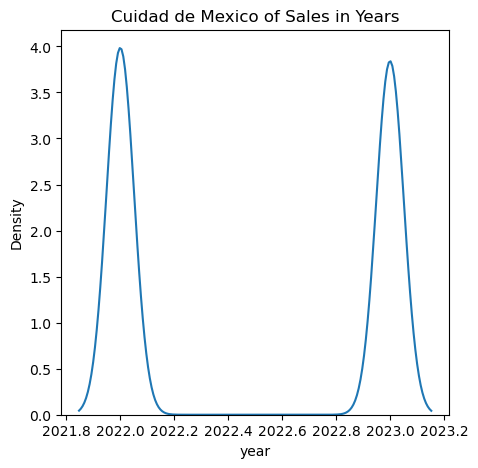

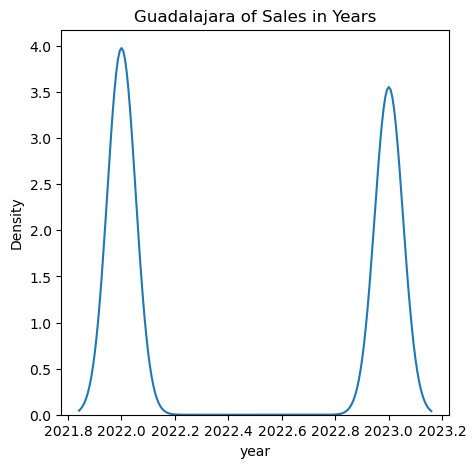

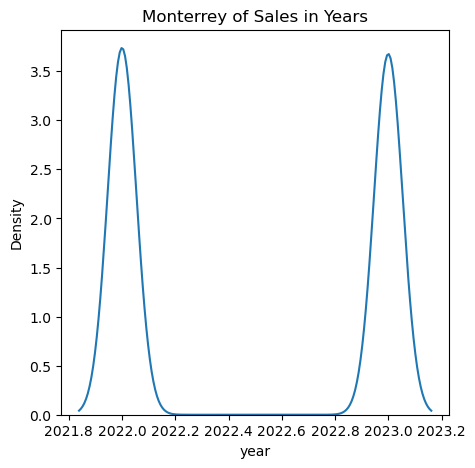

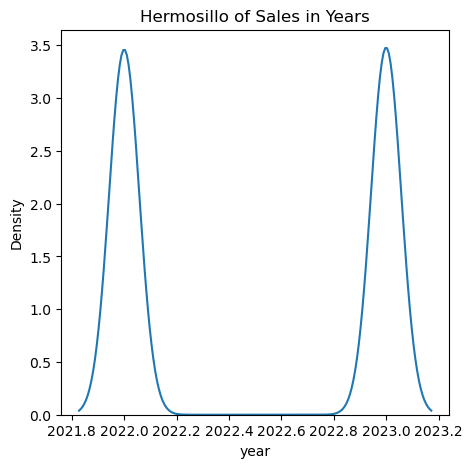

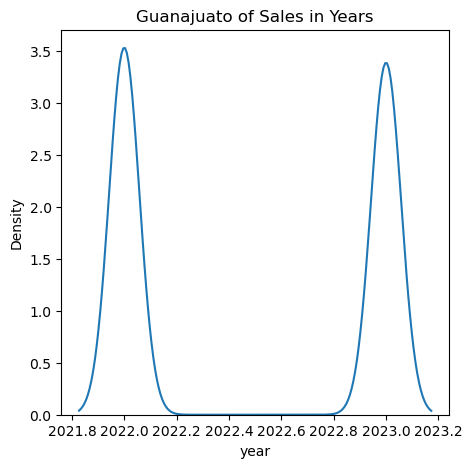

...

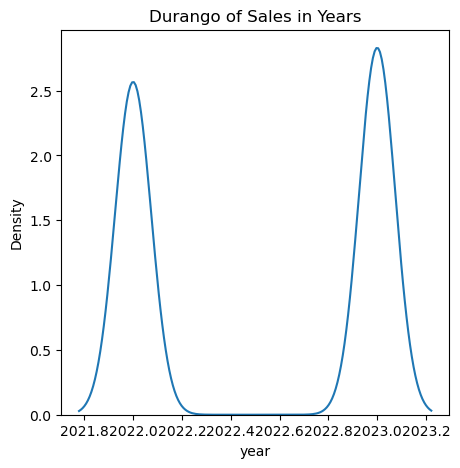

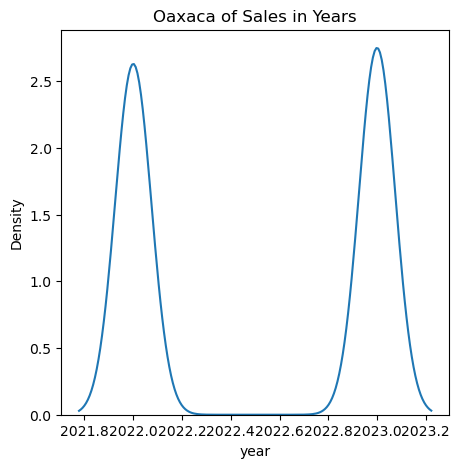

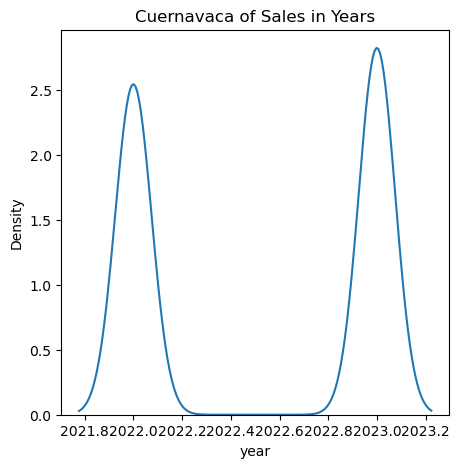

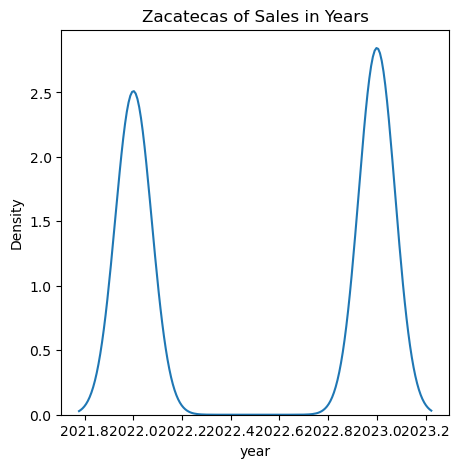

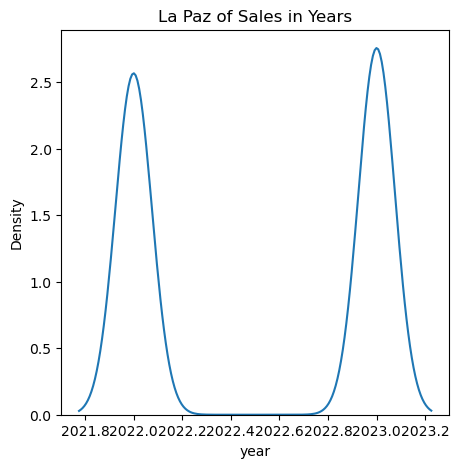

In [45]:
for i in data['Store_City'].value_counts().index:
    city=data[data['Store_City']==i]
    plt.figure(figsize=(5,5))
    plt.title(f'{i} of Sales in Years')
    sns.kdeplot(x=city['year'])

In [46]:
group2=data.groupby(['Store_City'])['Revenue'].sum()
fig=px.line(x=group2.index,y=group2.values,title='Store_City VS Revenue',height=1000,width=1000)
fig.update_yaxes(title='Revenue')

#### STORE_LOCATION

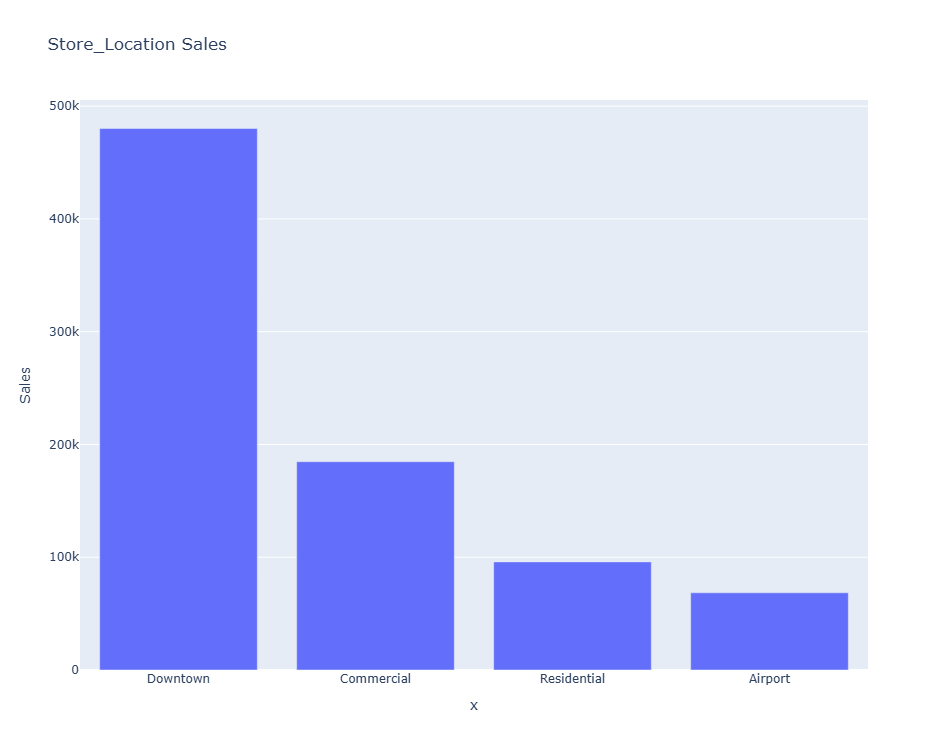

In [61]:
fig=px.bar(x=data['Store_Location'].value_counts().index,y=data['Store_Location'].value_counts().values,title='Store_Location Sales',height=750,width=750)
fig.update_yaxes(title='Sales')

In [49]:
group3=data.groupby(['Store_Location'])['Store_City'].nunique()
fig=px.bar(x=group3.index,y=group3.values,height=500,width=750,title='Numer of city in each Location')
fig.update_yaxes(title='Number of City')

In [50]:
group4=data.groupby(['Store_Location'])['Store_Name'].nunique()
fig=px.bar(x=group4.index,y=group4.values,height=500,width=750,title='Number of stores in each Location')
fig.update_yaxes(title='Number of Stores')

In [51]:
for i in data['Store_Location'].value_counts().index:
    store=data[data['Store_Location']==i]
    fig=px.line(x=store['Product_Name'].value_counts().index,y=store['Product_Name'].value_counts().values,title=f'the best seller product in {i} Location')
    fig.update_yaxes(title='Sales')
    fig.show()

In [52]:
for i in data['Store_Location'].value_counts().index:
    store=data[data['Store_Location']==i]
    fig=px.line(x=store['Product_Category'].value_counts().index,y=store['Product_Category'].value_counts().values,title=f'the best seller product_category in {i} Location')
    fig.update_yaxes(title='Sales')
    fig.show()

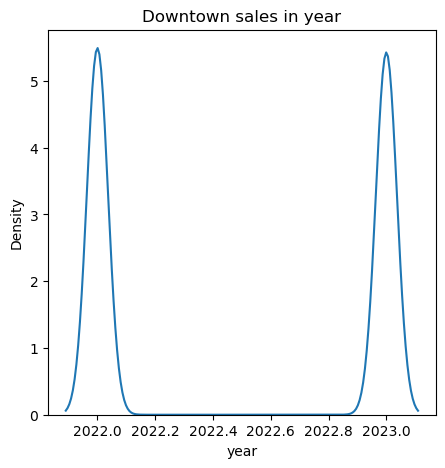

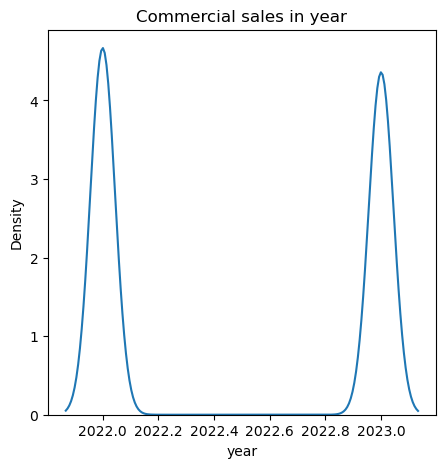

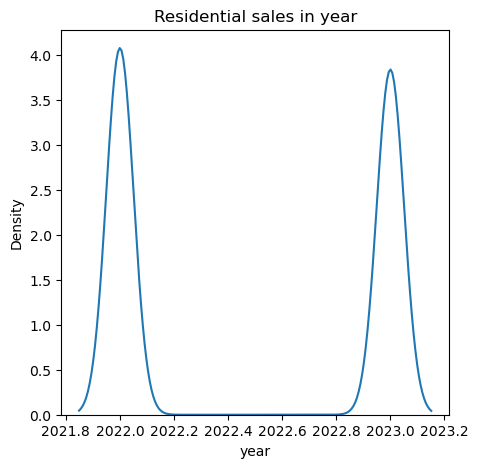

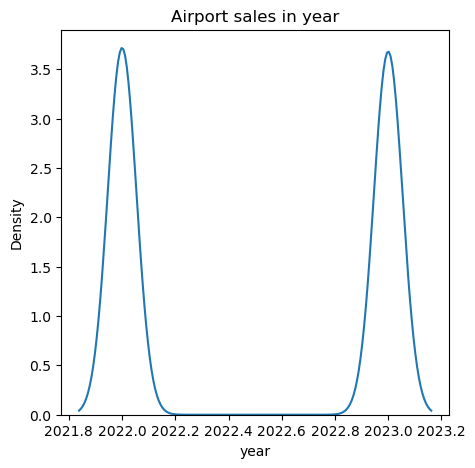

In [53]:
for i in data['Store_Location'].value_counts().index:
    location=data[data['Store_Location']==i]
    plt.figure(figsize=(5,5))
    plt.title(f'{i} sales in year')
    sns.kdeplot(x=location['year'])

In [54]:
group5=data.groupby(['Store_Location'])['Revenue'].sum()
fig=px.line(x=group5.index,y=group5.values,title='Store_Location VS Revenue',height=1000,width=1000)
fig.update_yaxes(title='Revenue')

## Products

#### Product Name

In [55]:
fig=px.bar(x=data['Product_Name'].value_counts().index,y=data['Product_Name'].value_counts().values,title='Sales of Products',height=750,width=1000)
fig.update_yaxes(title='Sales')

C:\Users\DELL\AppData\Local\Temp\ipykernel_11056\772130779.py:3: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.

C:\Users\DELL\AppData\Local\Temp\ipykernel_11056\772130779.py:5: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.

C:\Users\DELL\AppData\Local\Temp\ipykernel_11056\772130779.py:5: UserWarning:

Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.



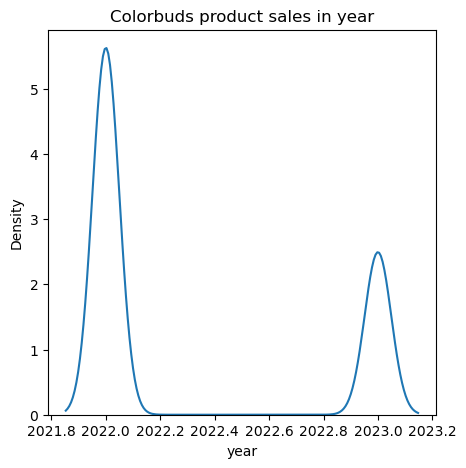

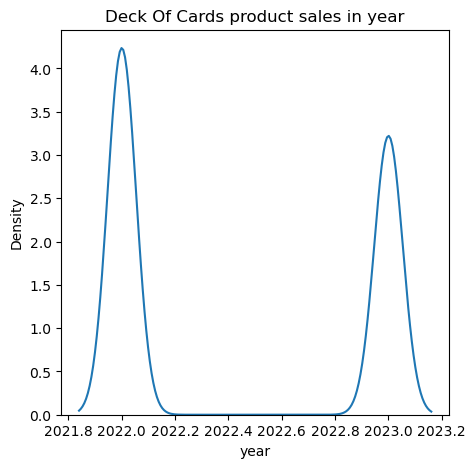

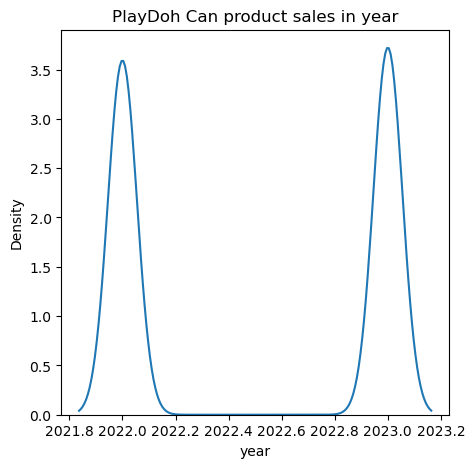

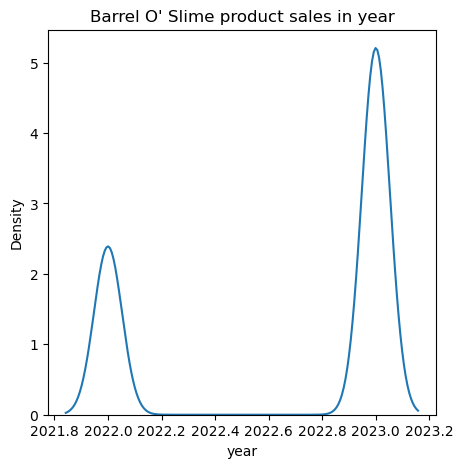

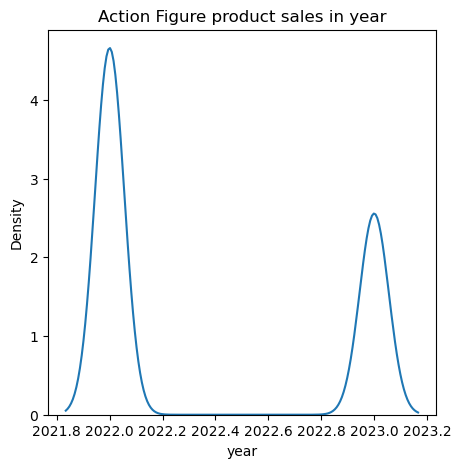

...

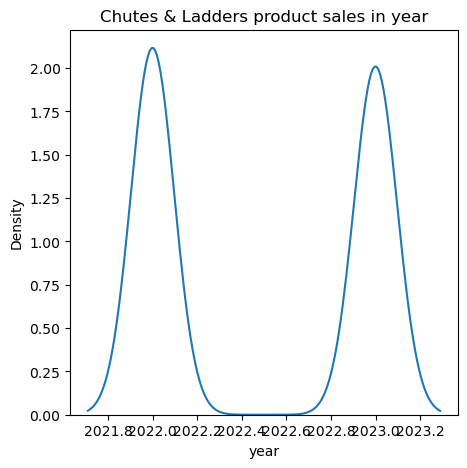

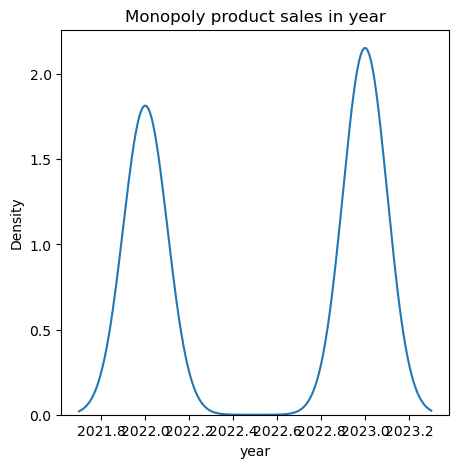

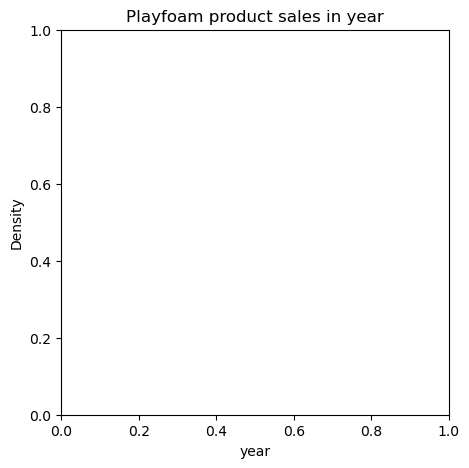

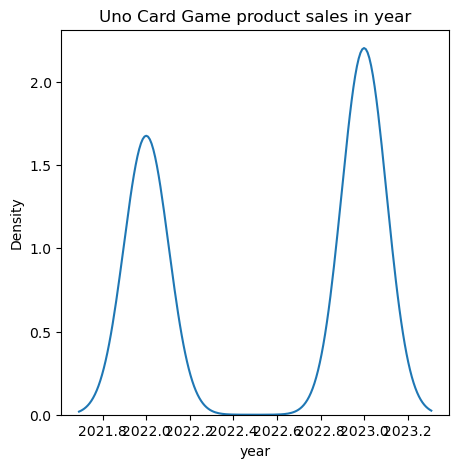

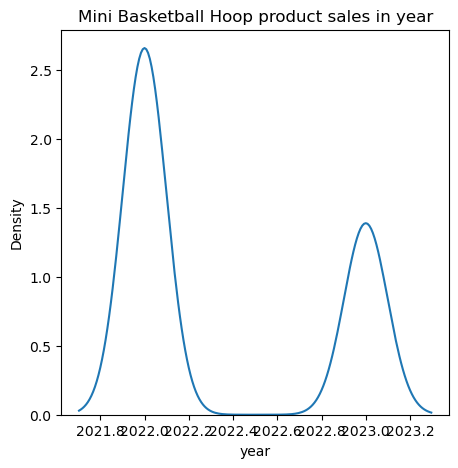

In [56]:
for i in data['Product_Name'].value_counts().index:
    product=data[data['Product_Name']==i]
    plt.figure(figsize=(5,5))
    plt.title(f'{i} product sales in year')
    sns.kdeplot(x=product['year'])

In [57]:
group6=data.groupby(['Product_Name'])['Revenue'].sum()
fig=px.line(x=group6.index,y=group6.values,title='Product_Name VS Revenue',height=1000,width=1000)
fig.update_yaxes(title='Revenue')

#### Proudct_Category

In [58]:
plt.figure(figsize=(15,10))
fig=px.bar(x=data['Product_Category'].value_counts().index,y=data['Product_Category'].value_counts().values,title='Sales of Product_Category',height=500,width=1000)
fig.update_yaxes(title='Sales')

<Figure size 1500x1000 with 0 Axes>

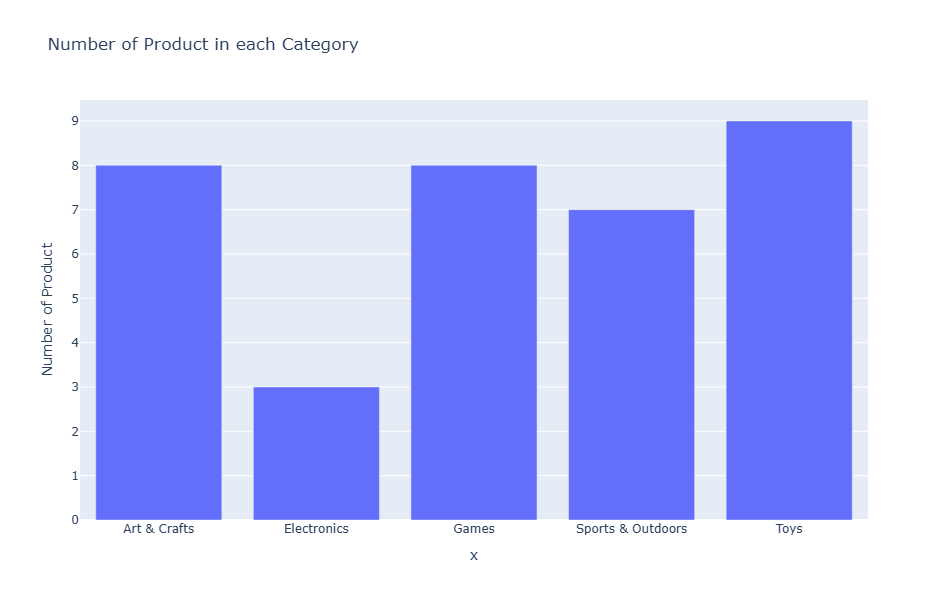

In [71]:
group7=data.groupby(['Product_Category'])['Product_Name'].nunique()
fig=px.bar(x=group7.index,y=group7.values,height=600,title='Number of Product in each Category',width=900)
fig.update_yaxes(title='Number of Product')

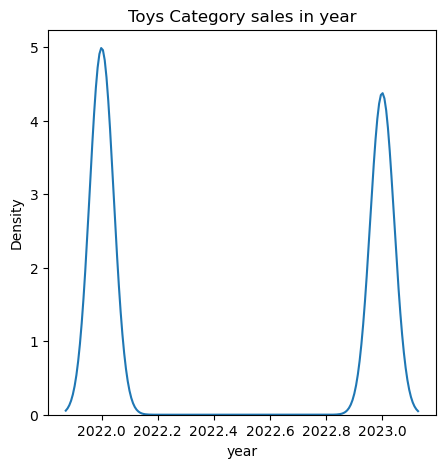

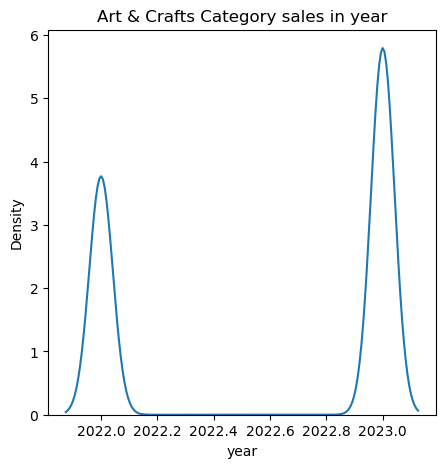

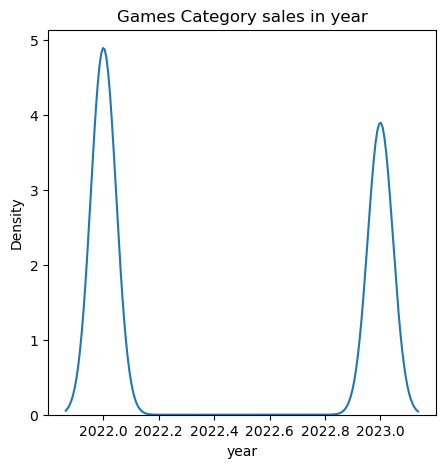

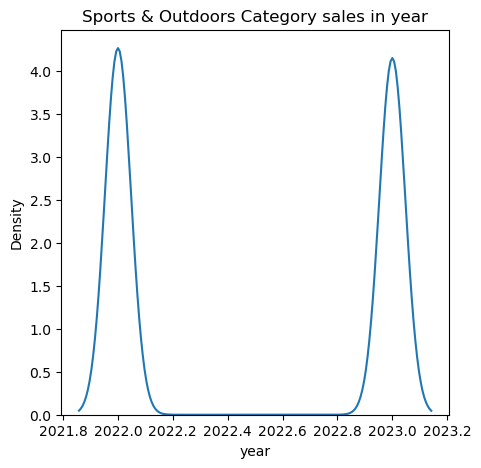

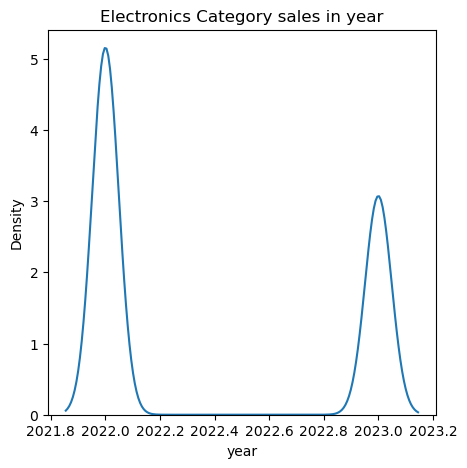

In [74]:
for i in data['Product_Category'].value_counts().index:
    product=data[data['Product_Category']==i]
    plt.figure(figsize=(5,5))
    plt.title(f'{i} Category sales in year')
    sns.kdeplot(x=product['year'])

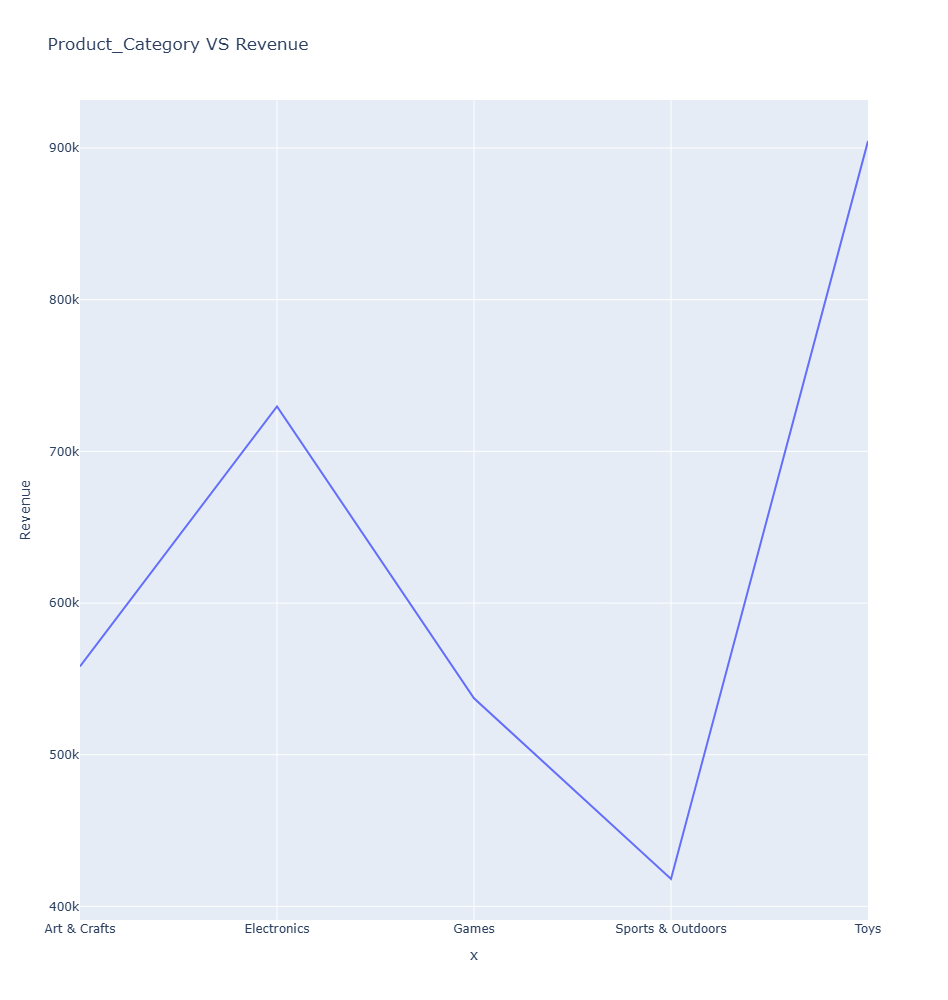

In [76]:
group8=data.groupby(['Product_Category'])['Revenue'].sum()
fig=px.line(x=group8.index,y=group8.values,title='Product_Category VS Revenue',height=1000,width=1000)
fig.update_yaxes(title='Revenue')

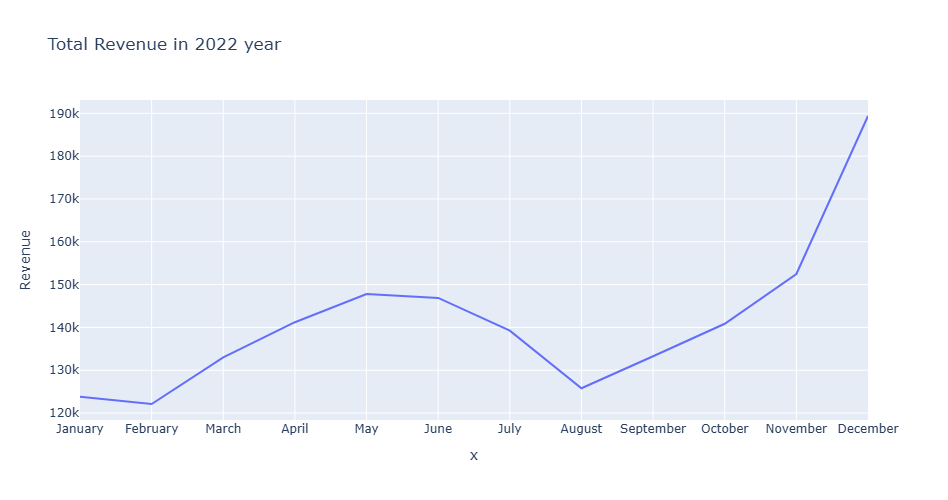

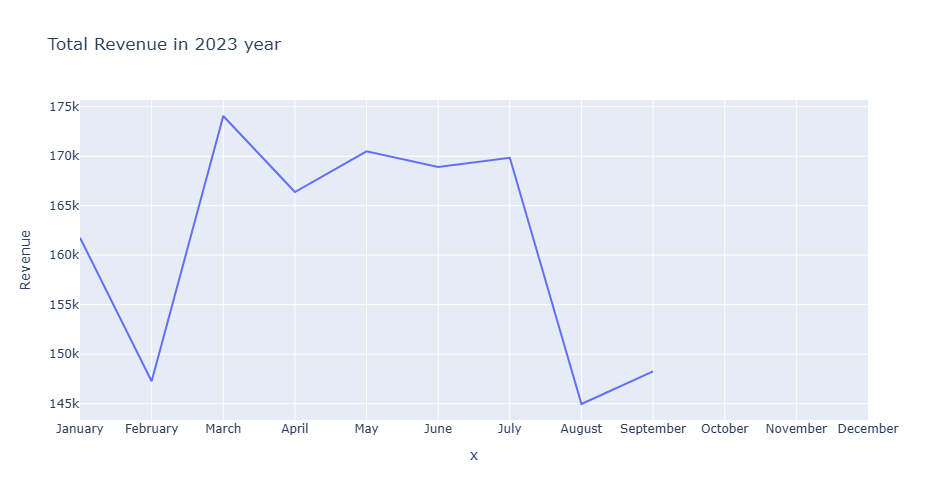

In [93]:
month_order = ['January','February','March','April','May','June','July','August','September','October','November','December']    
for i in data['year'].value_counts().index:
    store=data[data['year']==i]
    group9=store.groupby(['month'])['Revenue'].sum()
    group9=group9.reindex(month_order)
    fig=px.line(x=group9.index,y=group9.values,title=f'Total Revenue in {i} year',height=500,width=750)
    fig.update_yaxes(title='Revenue')
    fig.show()